In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import datetime as dt
from statsmodels.tsa.seasonal import seasonal_decompose             # Time series components
from statsmodels.tsa.stattools import adfuller                      # To find the stationarity of the data
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf       # To plot ACF and PACF plots
from statsmodels.tsa.arima.model import ARIMA                       # To build the ARIMA model
from sklearn.metrics import mean_squared_error                      # To check the mean square error                                      
from statsmodels.tsa.statespace.sarimax import SARIMAX              # To build the sarimax model 
import statsmodels.api as sm                                 
import warnings
warnings.filterwarnings('ignore')

In [38]:
digi_music=pd.read_csv("digi_muse_data (1).csv")

In [39]:
digi_music

,Unnamed: 0,asin,title,overall,brand,rank,verified,reviewerID,reviewerName,reviewTime,price,style,category,also_buy,also_view,main_cat,similar_item,Review,polarity,Sentiment
0,0,7019098606,Live...Again,5,Brooklyn Tabernacle Choir,725231,True,A2KLYLMS27MMSX,C. oliver,2014-12-12,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",NaN,brooklyn tab not beat gospel music sing kind w...,0.700000,Positive
1,1,7019098606,Live...Again,5,Brooklyn Tabernacle Choir,725231,True,A1IOEZDAZD6X51,Raf,2014-12-09,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",NaN,greatfive star,0.000000,Neutral
2,2,7019098606,Live...Again,5,Brooklyn Tabernacle Choir,725231,True,A1LUTAW6O69PQP,Paula Milo-Moultrie,2014-12-05,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",NaN,music inspire enjoy listen singing alongi enjo...,0.400000,Positive
3,3,7019098606,Live...Again,5,Brooklyn Tabernacle Choir,725231,True,A1UUCVS78RELYW,jadamtam,2014-09-29,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",NaN,beautiful songsfive star,0.850000,Positive
4,4,7019098606,Live...Again,5,Brooklyn Tabernacle Choir,725231,True,A1E2OY42QMGRXR,Chester Thrash,2014-09-06,13.71,Format Audio Cassette,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",NaN,favorite love iti love,0.500000,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79496,140814,B01HDRMCXK,Philip Glass - Prophecies,5,Anton Batagov,196423,False,A165B22J07IED1,Roland,2016-10-17,18.99,Format Audio CD,[],"['B075ZC8C25', 'B01EBIJTX0', 'B00TYDOA6O', 'B0...","['B07J35QFY6', 'B075ZC8C25', 'B07D95GL9V', 'B0...","<img src=""https://images-na.ssl-images-amazon....",NaN,like hear philip glass solo piano solo piano v...,0.425000,Positive
79497,140815,B01HDRMCXK,Philip Glass - Prophecies,5,Anton Batagov,196423,False,A1Q7UZQUCK4MD5,ABR,2016-10-05,18.99,Format Audio CD,[],"['B075ZC8C25', 'B01EBIJTX0', 'B00TYDOA6O', 'B0...","['B07J35QFY6', 'B075ZC8C25', 'B07D95GL9V', 'B0...","<img src=""https://images-na.ssl-images-amazon....",NaN,excellent choice piece cover high point einste...,0.419184,Positive
79498,140819,B01HF1Z5JW,Sound Mirrors,5,Covenant,323298,True,A3NV56DLGAK74H,L,2017-11-22,13.86,Format Audio CD,[],"['B01KI262EC', 'B07CLP4ZL4', 'B00E9E4HFW', 'B0...","['B00E9E4HFW', 'B00006J44B']","<img src=""https://images-na.ssl-images-amazon....",NaN,love covenantfive star,0.500000,Positive
79499,140820,B01HF1Z5JW,Sound Mirrors,4,Covenant,323298,True,AANTLC5FKVMLJ,StuartPercy,2016-12-01,13.86,Format Audio CD,[],"['B01KI262EC', 'B07CLP4ZL4', 'B00E9E4HFW', 'B0...","['B00E9E4HFW', 'B00006J44B']","<img src=""https://images-na.ssl-images-amazon....",NaN,pretty good epfour star,0.475000,Positive


In [40]:
digi_music2 =digi_music[["Sentiment","Review"]]
digi_music2.groupby('Sentiment').describe()

Review                                 
           count unique                  top freq
Sentiment                                        
Negative    4425   4406  pink floydfive star    4
Neutral     9728   6276       greatfive star  547
Positive   65346  62176     love itfive star  556

In [7]:
digi_music.shape

(79501, 19)

In [41]:
digi_music.isnull().sum()

Unnamed: 0          0
asin                0
title             591
overall             0
brand            7590
rank                0
verified            0
reviewerID          0
reviewerName        1
reviewTime          0
price               0
style               0
category            0
also_buy            0
also_view           0
main_cat            0
similar_item    79501
Review              2
polarity            0
Sentiment           0
dtype: int64

In [42]:
digi_music.dropna(inplace=True,axis=1) #deleting the null values

# Convert the reviewTime column to a datetime format:

In [43]:
digi_music['reviewTime'] =pd.to_datetime(digi_music['reviewTime'])

In [36]:
digi_music.dtypes

Unnamed: 0               int64
asin                    object
title                   object
overall                  int64
brand                   object
rank                     int64
verified                  bool
reviewerID              object
reviewerName            object
reviewTime      datetime64[ns]
price                  float64
style                   object
category                object
also_buy                object
also_view               object
main_cat                object
similar_item           float64
Review                  object
polarity               float64
Sentiment               object
dtype: object

# sentiment forcasting

In [44]:
df=digi_music.copy()
df.head(5)

,Unnamed: 0,asin,overall,rank,verified,reviewerID,reviewTime,price,style,category,also_buy,also_view,main_cat,polarity,Sentiment
0,0,7019098606,5,725231,True,A2KLYLMS27MMSX,2014-12-12,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.70,Positive
1,1,7019098606,5,725231,True,A1IOEZDAZD6X51,2014-12-09,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.00,Neutral
2,2,7019098606,5,725231,True,A1LUTAW6O69PQP,2014-12-05,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.40,Positive
3,3,7019098606,5,725231,True,A1UUCVS78RELYW,2014-09-29,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.85,Positive
4,4,7019098606,5,725231,True,A1E2OY42QMGRXR,2014-09-06,13.71,Format Audio Cassette,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.50,Positive


In [45]:
df.isnull().sum()

Unnamed: 0    0
asin          0
overall       0
rank          0
verified      0
reviewerID    0
reviewTime    0
price         0
style         0
category      0
also_buy      0
also_view     0
main_cat      0
polarity      0
Sentiment     0
dtype: int64

In [46]:
# Setting the index as Date
df= df.set_index('reviewTime')
df.head()

,Unnamed: 0,asin,overall,rank,verified,reviewerID,price,style,category,also_buy,also_view,main_cat,polarity,Sentiment
reviewTime,,,,,,,,,,,,,,
2014-12-12,0,7019098606,5,725231,True,A2KLYLMS27MMSX,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.70,Positive
2014-12-09,1,7019098606,5,725231,True,A1IOEZDAZD6X51,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.00,Neutral
2014-12-05,2,7019098606,5,725231,True,A1LUTAW6O69PQP,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.40,Positive
2014-09-29,3,7019098606,5,725231,True,A1UUCVS78RELYW,13.71,Format Audio CD,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.85,Positive
2014-09-06,4,7019098606,5,725231,True,A1E2OY42QMGRXR,13.71,Format Audio Cassette,[],"['B00004R8SJ', 'B00SLEJI78', 'B000002MJ3', 'B0...","['B00004R8SJ', 'B079PDJSRJ', 'B00SLEJI78', 'B0...","<img src=""https://images-na.ssl-images-amazon....",0.50,Positive


In [47]:
positive=df[(df['Sentiment']=='Positive')]
negative=df[(df['Sentiment']=='Negative')]
neutral=df[(df['Sentiment']=='Neutral')]

In [48]:
pos_df=positive[['polarity']]
pos_df

,polarity
reviewTime,
2014-12-12,0.700000
2014-12-05,0.400000
2014-09-29,0.850000
2014-09-06,0.500000
2012-12-29,0.733333
...,...
2016-10-17,0.425000
2016-10-05,0.419184
2017-11-22,0.500000


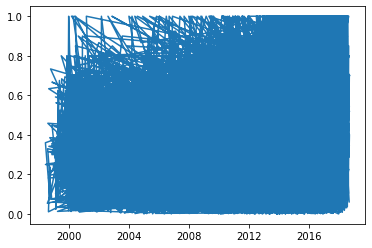

In [49]:
plt.plot(pos_df);

In [50]:
pos_df= pos_df.resample('MS').mean()
pos_df.isnull().sum()

polarity    0
dtype: int64

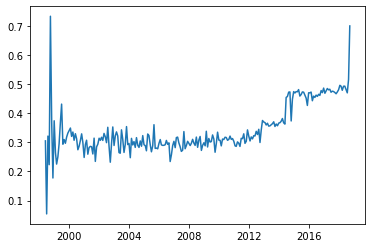

In [51]:
plt.plot(pos_df);

In [52]:
pos_df["polarity"] = pos_df["polarity"].interpolate(option="spline")

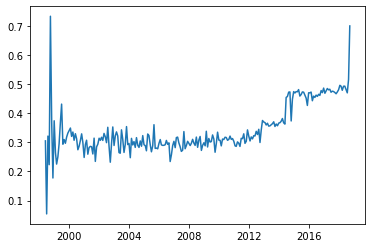

In [53]:
plt.plot(pos_df);

In [54]:
def check_data(data):
    pvalue = adfuller(data)[1]
    print("pvalue",pvalue)
    if pvalue < 0.05:
        msg = "Data is stationary"
    else:
        msg = "Data is not stationary"
    return msg

In [55]:
check_data(pos_df)

pvalue 0.9945578681909515


'Data is not stationary'

In [56]:
for i in range(1,5):
    x = pos_df-pos_df.shift(i)
    x.dropna(inplace=True)
    msg = check_data(x)
    if msg == "Data is stationary":
        print("Shift value",i,msg)
        break

pvalue 2.0242088580313916e-30
Shift value 1 Data is stationary


In [57]:
# Decomposition plot for predicted data using Features
decomposition_p=seasonal_decompose((pos_df), period=12)
trend=decomposition_p.trend
seasonal=decomposition_p.seasonal
residual=decomposition_p.resid

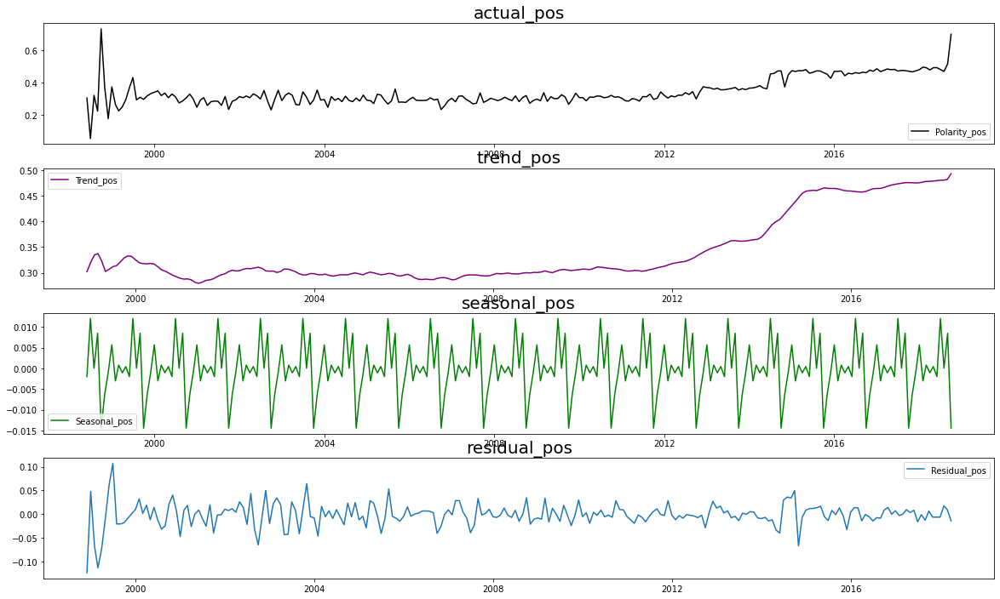

In [58]:
ig,ax = plt.subplots(4,1,figsize=(20,12))

plt.subplot(411)
plt.plot(pos_df,label='Polarity_pos',c='black')
plt.legend()
plt.title('actual_pos', fontsize = 20)

plt.subplot(412)
plt.plot(trend,label='Trend_pos',c='purple')
plt.legend()
plt.title('trend_pos', fontsize = 20)

plt.subplot(413)
plt.plot(seasonal,label='Seasonal_pos',c='green')
plt.legend()
plt.title('seasonal_pos', fontsize = 20)

plt.subplot(414)
plt.plot(residual,label='Residual_pos')
plt.legend()
plt.title('residual_pos', fontsize = 20)
plt.show()

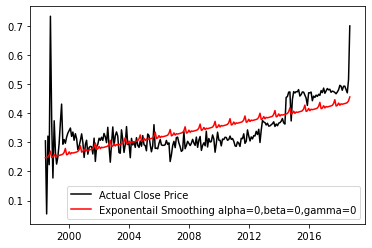

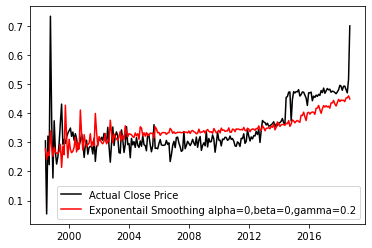

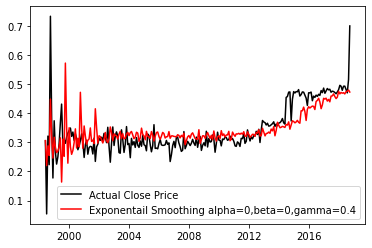

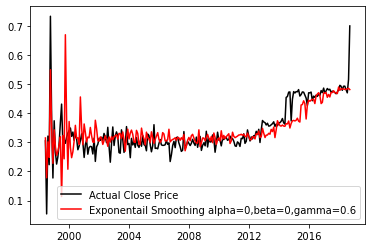

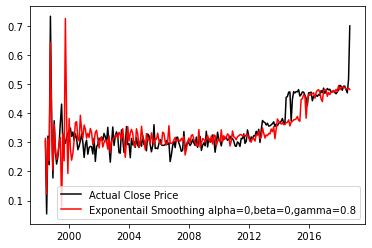

...

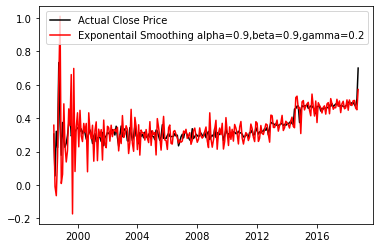

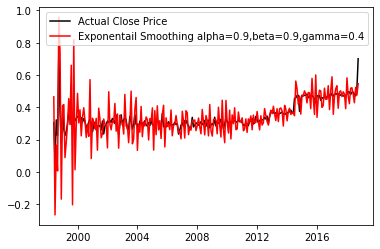

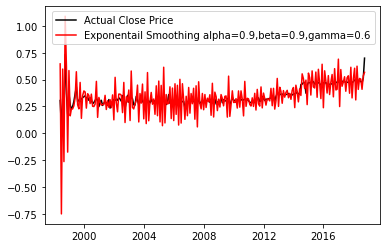

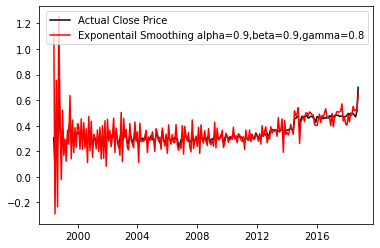

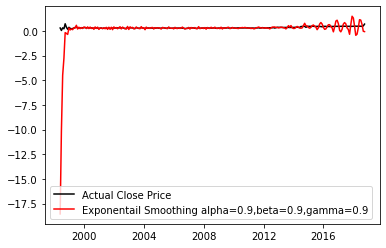

In [59]:
from statsmodels.tsa.api import ExponentialSmoothing
for alpha in [0,0.2,0.4,0.6,0.8,0.9]:
    for beta in [0,0.2,0.4,0.6,0.8,0.9]:
        for gamma in [0,0.2,0.4,0.6,0.8,0.9]:
            model = ExponentialSmoothing(pos_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
            plt.plot(pos_df,color='black',label="Actual Close Price")
            plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing alpha={alpha},beta={beta},gamma={gamma}')
            plt.legend()
            plt.show();

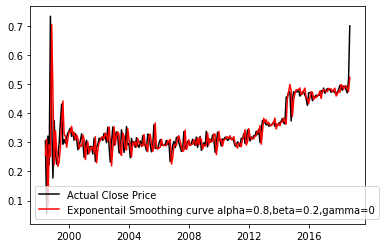

In [101]:
alpha = 0.8
beta = 0.2
gamma = 0
model = ExponentialSmoothing(pos_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
plt.plot(pos_df,color='black',label="Actual Close Price")
plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing curve alpha={alpha},beta={beta},gamma={gamma}')
plt.legend()
plt.show();

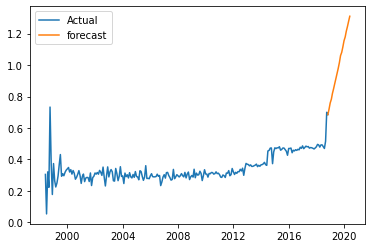

In [102]:
cd = model.forecast(20)
bx = pos_df["polarity"].append(cd[0:1])
plt.plot(bx,label="Actual")
plt.plot(cd,label="forecast")
plt.legend();

In [103]:
check_data(model.fittedvalues)

pvalue 0.9655776303901232


'Data is not stationary'

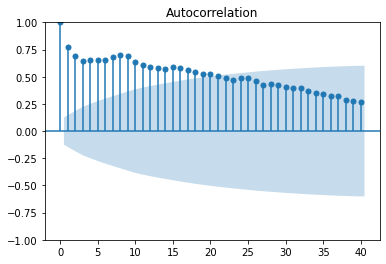

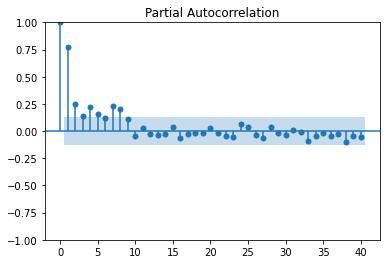

In [104]:
plot_acf(model.fittedvalues,lags=40)
plot_pacf(model.fittedvalues,lags=40);

In [ ]:
ACF(p)->q value=17[]
PACF(q)->p value=6[1,2,3,4,5,6,7]

In [105]:
for p in range(1,7):
    for q in range(1,18):
        mod = sm.tsa.statespace.SARIMAX(model.fittedvalues,order=(p,1,q),seasonal_order=None).fit()
        print("for ", p , q, mod.aic)

for  1 1 -828.1566393614207
for  1 2 -826.7934872510807
for  1 3 -829.9608162394509
for  1 4 -834.9407925049514
for  1 5 -832.6063833713193
for  1 6 -830.9721556152278
for  1 7 -832.2695347965671
for  1 8 -830.8169774410496
for  1 9 -829.046144126605
for  1 10 -846.9432232728773
for  1 11 -847.1664515816149
for  1 12 -845.4853864938573
for  1 13 -843.451505998669
for  1 14 -829.6257336635332
for  1 15 -842.0677288137892
for  1 16 -841.3056985476196
for  1 17 -839.4141785179285
for  2 1 -827.6271484986021
for  2 2 -825.0479201030521
for  2 3 -819.8459326436233
for  2 4 -826.2243829391506
for  2 5 -828.0558913389725
for  2 6 -832.5944581307697
for  2 7 -839.5078809922246
for  2 8 -836.819227007898
for  2 9 -837.9923293728941
for  2 10 -843.0550918273342
for  2 11 -843.4872825075904
for  2 12 -843.6908053650685
for  2 13 -841.5595922334246
for  2 14 -839.4592631744715
for  2 15 -840.7690581853581
for  2 16 -838.7932295649598
for  2 17 -836.9237458336963
for  3 1 -831.6580014941064
for  3 

# applying SARIMAX model

In [94]:
rows = int(0.8*len(model.fittedvalues))
pos_train = pos_df[:rows]

pos_test = pos_df[rows:]

In [109]:
pos_mod = sm.tsa.statespace.SARIMAX(pos_train,order=(1,1,1),seasonal_order=(1,1,1,20)).fit()
pp_model = pos_mod.fittedvalues
print(pos_mod.summary())

                                     SARIMAX Results                                      
Dep. Variable:                           polarity   No. Observations:                  196
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 20)   Log Likelihood                 266.646
Date:                            Thu, 06 Apr 2023   AIC                           -523.292
Time:                                    16:25:29   BIC                           -507.468
Sample:                                06-01-1998   HQIC                          -516.873
                                     - 09-01-2014                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0543      0.101      0.537      0.591      -0.144       0.252
ma.L1         -0.9286      0.058   

In [110]:
pos_str = len(pos_train)
pos_end = len(pos_train)+(len(pos_test)-1)

In [120]:
pvalue = sm.stats.acorr_ljungbox(pos_mod.resid,lags=[1],return_df=True)['lb_pvalue'].values
print(pvalue)
if pvalue < 0.05:
    print('Reject H0.BAD MODEL')
else:
    print("FAILED to Reject H0.Good MODEL")

[8.63964351e-06]
FAILED to Reject H0.Good MODEL


In [113]:
forcast = pos_mod.forecast(60)

In [114]:
pos_pred = pos_mod.predict(pos_str,pos_end)

In [115]:
df_sarima_res_pos = pd.DataFrame({"Predictions":pos_pred})
df_sarima_res_pos["Actual"] = pos_test
df_sarima_res_pos["err"] = df_sarima_res_pos["Actual"]-df_sarima_res_pos["Predictions"]

df_sarima_res_pos

,Predictions,Actual,err
2014-10-01,0.396593,0.473121,0.076528
2014-11-01,0.398830,0.373425,-0.025405
2014-12-01,0.406137,0.447911,0.041775
2015-01-01,0.401162,0.474183,0.073021
2015-02-01,0.391856,0.469648,0.077792
2015-03-01,0.395548,0.474319,0.078771
2015-04-01,0.409384,0.473698,0.064313
2015-05-01,0.408633,0.481209,0.072577
2015-06-01,0.395916,0.459015,0.063099
2015-07-01,0.402864,0.464030,0.061166


In [116]:
pos_pp = pos_train["polarity"].append(pos_pred[0:1])

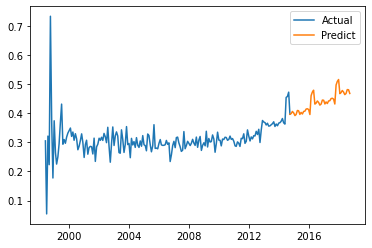

In [117]:
plt.plot(pos_pp,label="Actual")
plt.plot(pos_pred,label="Predict")
plt.legend();

In [119]:
from sklearn.metrics import mean_squared_error
pos_mse = mean_squared_error(pos_pred,pos_test)
print("Positive mse",pos_mse)
print("Positive rmse",np.sqrt(pos_mse))

Positive mse 0.0030456684618677733
Positive rmse 0.055187575249033845


#    NEGATIVE SENTIMENT TIME SERIES ANALYSIS

In [121]:
neg_df=negative[['polarity']]
neg_df

,polarity
reviewTime,
2000-05-03,-0.312500
2009-05-08,-0.044108
2011-11-08,-0.300000
2016-03-22,-0.300000
2001-09-19,-0.200000
...,...
2016-07-13,-0.021958
2018-01-29,-0.004762
2017-02-13,-0.033333


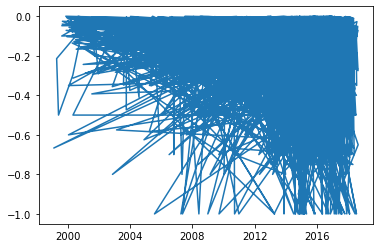

In [122]:
plt.plot(neg_df);

In [123]:
neg_df= neg_df.resample('MS').mean()
neg_df.isnull().sum()

polarity    10
dtype: int64

In [124]:
neg_df["polarity"] = neg_df["polarity"].interpolate(option='spline')
neg_df.isnull().sum()

polarity    0
dtype: int64

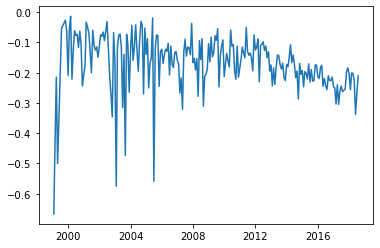

In [125]:
plt.plot(neg_df);


In [126]:
check_data(neg_df)  #checking stationary of data

pvalue 1.9409177739828214e-07


'Data is stationary'

In [127]:
check_data(neg_df)  #checking stationary of data

pvalue 1.9409177739828214e-07


'Data is stationary'

In [128]:
# Decomposition plot for predicted data using Features
decomposition_p=seasonal_decompose((neg_df), period=12)
trend=decomposition_p.trend
seasonal=decomposition_p.seasonal
residual=decomposition_p.resid

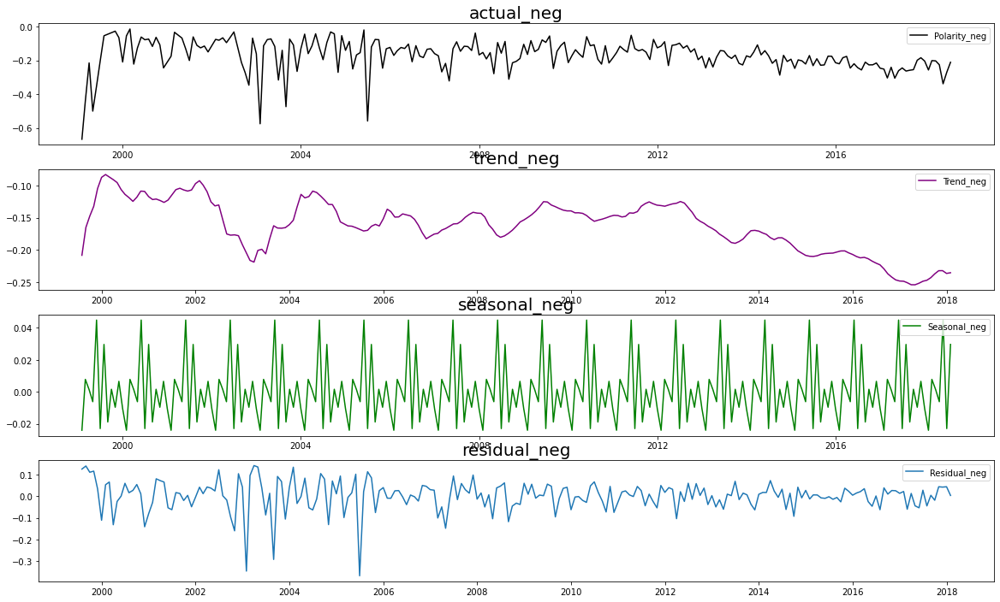

In [129]:
ig,ax = plt.subplots(4,1,figsize=(20,12))

plt.subplot(411)
plt.plot(neg_df,label='Polarity_neg',c='black')
plt.legend()
plt.title('actual_neg', fontsize = 20)

plt.subplot(412)
plt.plot(trend,label='Trend_neg',c='purple')
plt.legend()
plt.title('trend_neg', fontsize = 20)

plt.subplot(413)
plt.plot(seasonal,label='Seasonal_neg',c='green')
plt.legend()
plt.title('seasonal_neg', fontsize = 20)

plt.subplot(414)
plt.plot(residual,label='Residual_neg')
plt.legend()
plt.title('residual_neg', fontsize = 20)
plt.show()

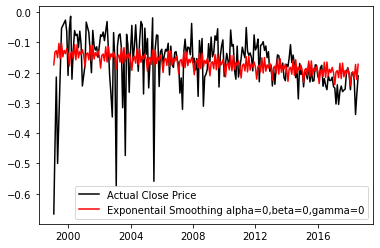

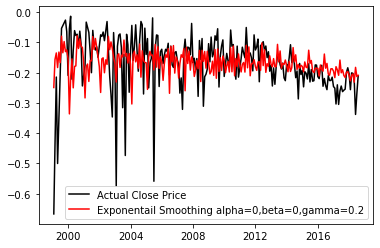

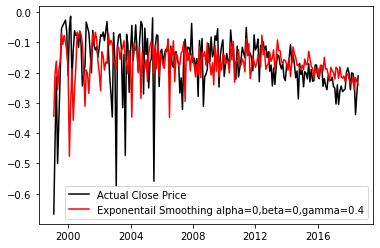

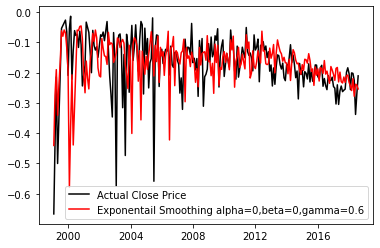

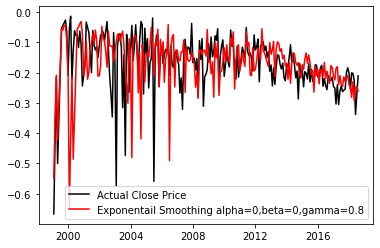

...

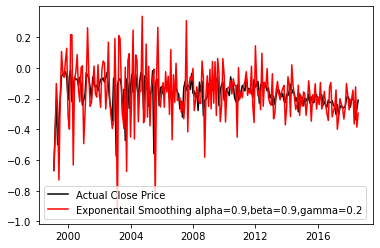

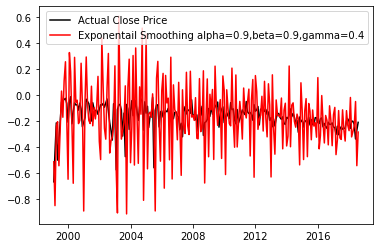

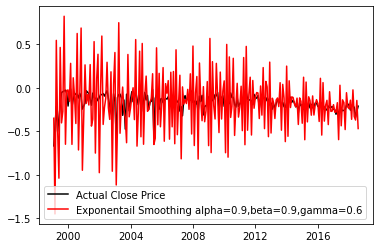

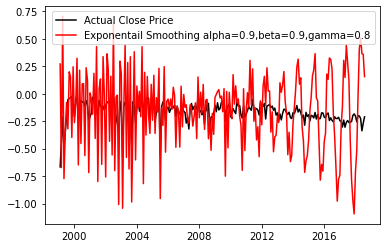

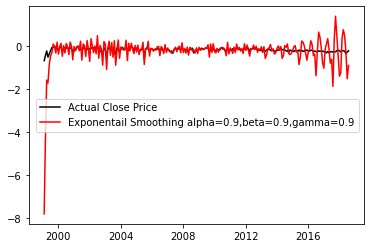

In [130]:
for alpha in [0,0.2,0.4,0.6,0.8,0.9]:
    for beta in [0,0.2,0.4,0.6,0.8,0.9]:
        for gamma in [0,0.2,0.4,0.6,0.8,0.9]:
            model = ExponentialSmoothing(neg_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
            plt.plot(neg_df,color='black',label="Actual Close Price")
            plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing alpha={alpha},beta={beta},gamma={gamma}')
            plt.legend()
            plt.show();

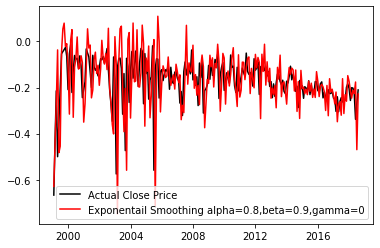

In [131]:
alpha = 0.8
bete = 0.2
gamma = 0
model = ExponentialSmoothing(neg_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
plt.plot(neg_df,color='black',label="Actual Close Price")
plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing alpha={alpha},beta={beta},gamma={gamma}')
plt.legend()
plt.show();

In [132]:
sx = model.forecast(60)
dd = neg_df["polarity"].append(sx[0:1])

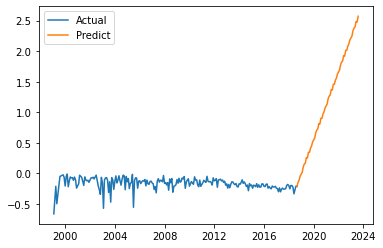

In [133]:
plt.plot(dd,label="Actual")
plt.plot(sx,label="Predict")
plt.legend();

In [134]:
check_data(model.fittedvalues)

pvalue 3.5886884313282234e-08


'Data is stationary'

# Plotting ACF and PACF graph

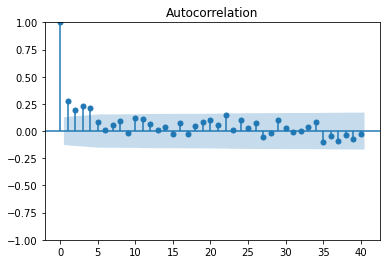

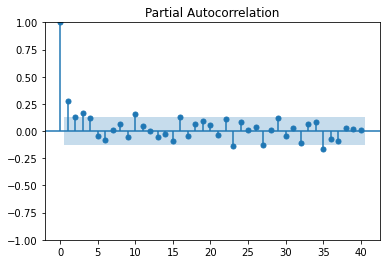

In [135]:
plot_acf(neg_df,lags=40)
plot_pacf(neg_df,lags=40);

ACF(P)-->4
PACF(Q)-->4

In [136]:
for q in range(1,5):
    for p in range(1,5):
        mod = sm.tsa.statespace.SARIMAX(neg_df,order=(p,0,q),seasonal_order=None).fit()
        print("for ", p , q, mod.aic)

for  1 1 -470.96261824948954
for  2 1 -468.98322073096114
for  3 1 -468.4624724258857
for  4 1 -468.1646340460375
for  1 2 -468.9280831463295
for  2 2 -466.9642229627261
for  3 2 -466.5842798216527
for  4 2 -466.12917621262716
for  1 3 -467.86488485456266
for  2 3 -466.4546874943645
for  3 3 -463.90657919636584
for  4 3 -463.92972519350457
for  1 4 -466.1299969373023
for  2 4 -467.0774660184219
for  3 4 -470.00006199442254
for  4 4 -467.61007066548086


In [ ]:
p=3,q=3,d=0
P=3,Q=3,D=0

In [137]:
n_num = int(0.8*len(neg_df))
neg_train = neg_df[:n_num]
neg_test = neg_df[n_num:]

In [138]:
negs_mod = sm.tsa.statespace.SARIMAX(neg_train,order=(3,0,3),seasonal_order=(3,0,1,12)).fit()
nn_model = negs_mod.fittedvalues
print(negs_mod.summary())

                                      SARIMAX Results                                       
Dep. Variable:                             polarity   No. Observations:                  188
Model:             SARIMAX(3, 0, 3)x(3, 0, [1], 12)   Log Likelihood                 174.508
Date:                              Thu, 06 Apr 2023   AIC                           -327.015
Time:                                      16:58:21   BIC                           -291.415
Sample:                                  02-01-1999   HQIC                          -312.591
                                       - 09-01-2014                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3547      0.685     -0.518      0.605      -1.698       0.989
ar.L2          0.58

# LjungBOX yest

In [139]:
pvalue = sm.stats.acorr_ljungbox(negs_mod.resid,lags=[1],return_df=True)['lb_pvalue'].values
print(pvalue)
if pvalue < 0.05:
    print('Reject H0.BAD MODEL')
else:
    print("FAILED to Reject H0.Good MODEL")

[0.54809955]
FAILED to Reject H0.Good MODEL


In [140]:
nn_str = len(neg_train)
nn_end = len(neg_train)+len(neg_test)-1

In [141]:
ng_pred = negs_mod.forecast(60)

In [142]:
nn_pred = negs_mod.predict(nn_str,nn_end)
nnd = neg_train["polarity"].append(nn_pred[0:1])

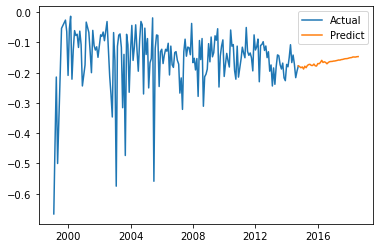

In [143]:
plt.plot(nnd,label="Actual")
plt.plot(nn_pred,label="Predict")
plt.legend();

In [144]:
ndf_sarima_res = pd.DataFrame({"Predictions":nn_pred})
ndf_sarima_res["Actual"] = neg_test
ndf_sarima_res["err"] = ndf_sarima_res["Actual"]-ndf_sarima_res["Predictions"]

ndf_sarima_res

,Predictions,Actual,err
2014-10-01,-0.177484,-0.286634,-0.109150
2014-11-01,-0.179922,-0.169332,0.010590
2014-12-01,-0.183482,-0.205912,-0.022430
2015-01-01,-0.180876,-0.192253,-0.011376
2015-02-01,-0.187805,-0.246701,-0.058896
2015-03-01,-0.178439,-0.196380,-0.017941
2015-04-01,-0.183467,-0.201963,-0.018496
2015-05-01,-0.176029,-0.220722,-0.044692
2015-06-01,-0.173049,-0.170609,0.002440
2015-07-01,-0.172227,-0.230516,-0.058288


In [145]:
neg_mse = mean_squared_error(nn_pred,neg_test)
print("Negative mse",neg_mse)
print("Negative rmse",np.sqrt(neg_mse))

Negative mse 0.005637332364596101
Negative rmse 0.07508217075042584


In [146]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objects as go
from plotly.offline import plot

# line chart to visualize the trend of forcasting postive reviews for the "musical instrument" dataset.

In [148]:
x = pos_pp.index
y = pos_pp.values
trace1 = go.Scatter(x=x,y=y,name="Pervious Trend of Positive Reviews")
x1 = forcast.index
y1 = forcast.values
trace2 = go.Scatter(x=x1,y=y1,name="Forecasted Trend of Positive Reviews")

data = [trace1,trace2]
layout = go.Layout(title = "Digital music data",yaxis=dict(title="Polarity score",zeroline=True,showline=True),
                  xaxis = dict(title = "Year"))

fig = go.Figure(data=data,layout=layout)

fig.show()

# line chart to visualize the trend of forcasting negative reviews for the "musical instrument" dataset.

In [149]:
x = nnd.index
y = nnd.values
trace1 = go.Scatter(x=x,y=y,name="Pervious trend of Negative Reviews")
x1 = ng_pred.index
y1 = ng_pred.values
trace2 = go.Scatter(x=x1,y=y1,name="Forecasted Future trend of Negative Reviews")

data = [trace1,trace2]
layout = go.Layout(title = "Digital music Data",yaxis=dict(title="Polarity Score",zeroline=True,showline=True),
                  xaxis = dict(title = "Year"))

fig = go.Figure(data=data,layout=layout)

fig.show()

# overal sentiment forecast

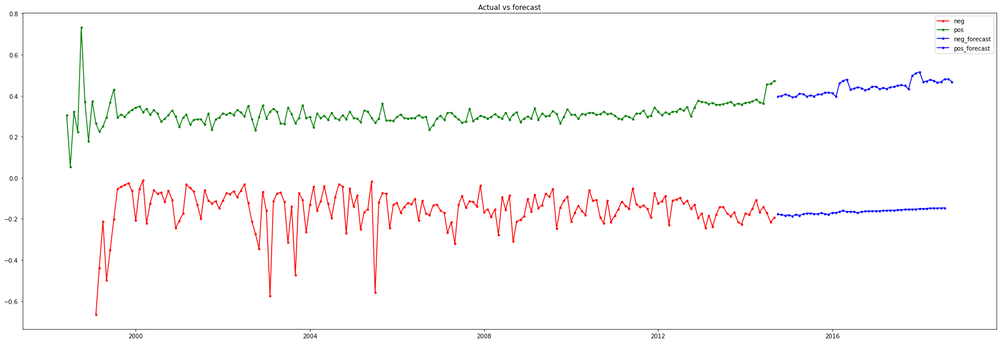

In [152]:
plt.figure(figsize=(30,10))
plt.title('Actual vs forecast')
plt.plot(neg_train["polarity"],marker = '.', label = 'neg', color = 'red')
plt.plot(pos_train["polarity"],marker = '.', label = 'pos', color = 'g')
plt.plot(nn_pred,marker = '.', label = 'neg_forecast', color = 'b')
plt.plot(pos_pred,marker = '.', label = 'pos_forecast', color = 'b')
plt.legend()

# conclusion:

In [ ]:
postive review are increases over the period where as negative review slightely increases as campare to postive one.